In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings

In [2]:
path_to_data = 'input/dog-breed-identification'
df = pd.read_csv(os.path.join(path_to_data,'labels.csv'))

E:\python\conda\envs\dog\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


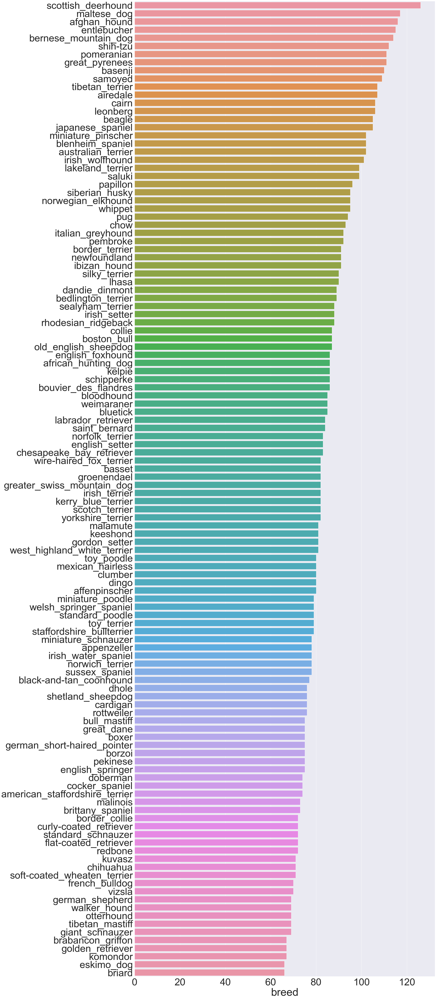

In [3]:
breed_distrib = df['breed'].value_counts()
breed_distrib.columns = ['breed', 'number']

# Horizontal bar plot
plt.figure(figsize=(30,100))
sns.set(style="whitegrid")
sns.set(font_scale=5)
ax = sns.barplot(breed_distrib,breed_distrib.index)
plt.show()

Number of breeds :  120


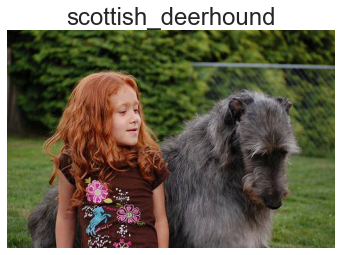

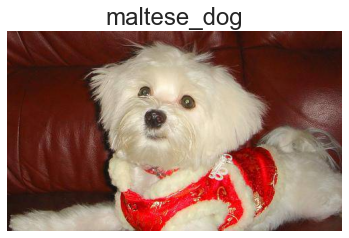

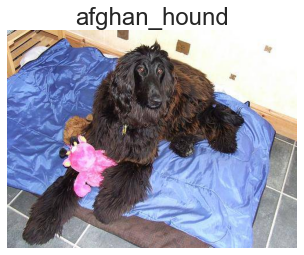

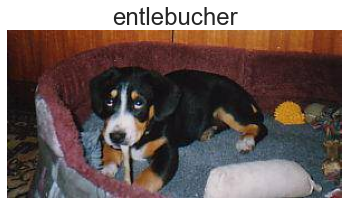

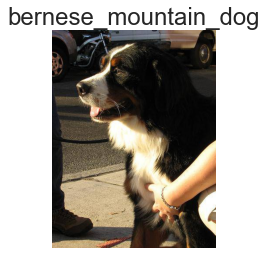

...

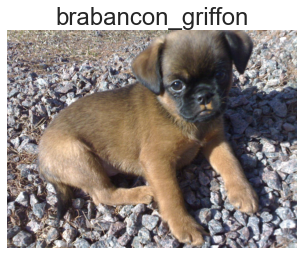

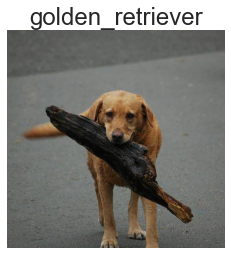

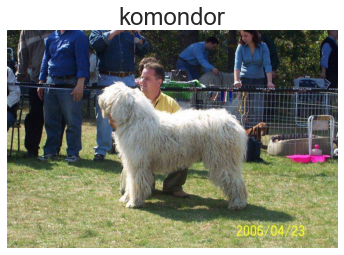

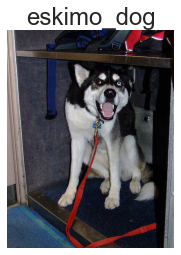

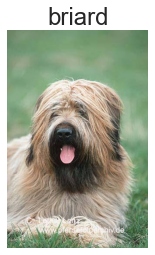

In [4]:

sns.set(font_scale=2)
n_breeds = len(breed_distrib.index)
print('Number of breeds : ', n_breeds)
for i in range(n_breeds):
    br = breed_distrib.index[i]
    path = df.loc[df['breed'] == br].iloc[0].id + '.jpg'
    path = os.path.join(path_to_data,'train',path)
    img = plt.imread(path)
    plt.axis('off')
    plt.imshow(img)\
    
    
    plt.title(br)
    plt.show() 

In [5]:
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions

Using TensorFlow backend.


In [6]:
vgg16_weights = 'vgg16_weights_tf_dim_ordering_tf_kernels.h5'
base_model = VGG16(weights=vgg16_weights)

In [7]:



base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [8]:
model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc1').output)
model.compile(optimizer='rmsprop', loss='categorical_crossentropy')

In [9]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder


df['breed'] = LabelEncoder().fit_transform(df['breed'])
y = df['breed'] 
onehot = OneHotEncoder()
y = onehot.fit_transform(np.expand_dims(y, axis=1)).toarray()

#Generator
def generator(df):
    path_train = 'input/dog-breed-identification/train'
    while 1:
        for i in range(int(df.shape[0])):
            img_path = os.path.join(path_train, df.iloc[i]['id']+ '.jpg')
    
            img = image.load_img(img_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)
            y = df.iloc[i]['breed']
            y = y.reshape(-1, 1)
            y = onehot.transform(y).toarray()
            #print(img.shape,np.array([y]).shape)
            yield (x,y)
                    
gen = generator(df)


In [10]:
X_pred = model.predict_generator(gen,steps=10221, verbose=1)

10221/10221 [==============================] - 2402s 235ms/step



# Final Predictions

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_pred, df.iloc[:10221]['breed'])

In [12]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train, y_train)

RandomForestClassifier()

In [13]:
y_pred = clf.predict(X_test)
y_pred

array([26,  3, 56, ..., 82, 67, 78])

## Evaluation

In [14]:
from sklearn.metrics import accuracy_score

acc = accuracy_score(y_test, y_pred)

print("Incredible accuracy of : ",acc)

Incredible accuracy of :  0.6651017214397497


In [15]:
y_pred

array([26,  3, 56, ..., 82, 67, 78])

Populating the interactive namespace from numpy and matplotlib


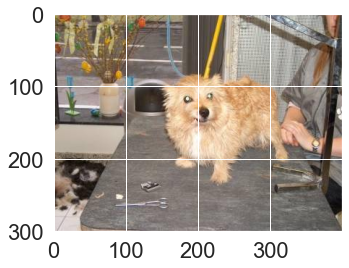

In [21]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('C:\\Users\\nikhilsai\\GNI MINI PROJECT DOGS BREED CLASSIFICATION\\MPIDL13\\CODE\RMPDL13\\input\\dog-breed-identification\\test\\0dc570ec7086bab004a7e357164c04b8.jpg')
imgplot = plt.imshow(img)
plt.show()

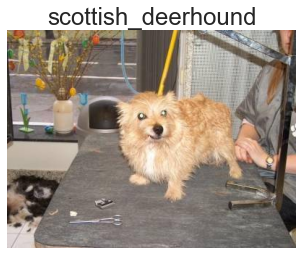

In [24]:
sns.set(font_scale=2)
br = breed_distrib.index[i]
pat = 'C:\\Users\\nikhilsai\\GNI MINI PROJECT DOGS BREED CLASSIFICATION\\MPIDL13\\CODE\RMPDL13\\input\\dog-breed-identification\\test\\0dc570ec7086bab004a7e357164c04b8.jpg'
imm = plt.imread(pat)
plt.axis('off')
plt.imshow(imm)
plt.title(br)
plt.show()

In [ ]:
breed_distrib